In [ ]:
import time
import cv2
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import imutils
import matplotlib.image as mpimg
from collections import OrderedDict
from skimage import io, transform
from math import *
import xml.etree.ElementTree as ET

import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms.functional as TF
from torchvision import datasets, models, transforms
from torch.utils.data import Dataset
from torch.utils.data import DataLoader

In [ ]:
%%capture
if not os.path.exists('/content/ibug_300W_large_face_landmark_dataset'):
    !wget http://dlib.net/files/data/ibug_300W_large_face_landmark_dataset.tar.gz
    !tar -xvzf 'ibug_300W_large_face_landmark_dataset.tar.gz'
    !rm -r 'ibug_300W_large_face_landmark_dataset.tar.gz'

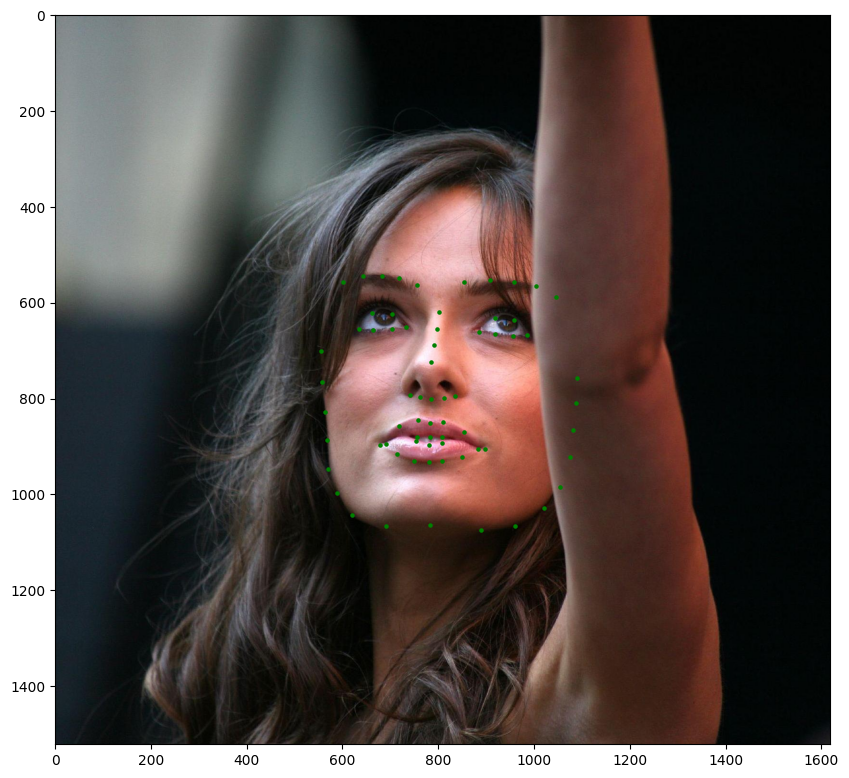

In [ ]:
file = open('ibug_300W_large_face_landmark_dataset/helen/trainset/100032540_1.pts')
points = file.readlines()[3:-1]

landmarks = []

for point in points:
    x,y = point.split(' ')
    landmarks.append([floor(float(x)), floor(float(y[:-1]))])

landmarks = np.array(landmarks)

plt.figure(figsize=(10,10))
plt.imshow(mpimg.imread('ibug_300W_large_face_landmark_dataset/helen/trainset/100032540_1.jpg'))
plt.scatter(landmarks[:,0], landmarks[:,1], s = 5, c = 'g')
plt.show()

In [ ]:
class Transforms():
    def __init__(self):
        pass

    def rotate(self, image, landmarks, angle):
        angle = random.uniform(-angle, +angle)

        transformation_matrix = torch.tensor([
            [+cos(radians(angle)), -sin(radians(angle))],
            [+sin(radians(angle)), +cos(radians(angle))]
        ])

        image = imutils.rotate(np.array(image), angle)

        landmarks = landmarks - 0.5
        new_landmarks = np.matmul(landmarks, transformation_matrix)
        new_landmarks = new_landmarks + 0.5
        return Image.fromarray(image), new_landmarks

    def resize(self, image, landmarks, img_size):
        image = TF.resize(image, img_size)
        return image, landmarks

    def color_jitter(self, image, landmarks):
        color_jitter = transforms.ColorJitter(brightness=0.3,
                                              contrast=0.3,
                                              saturation=0.3,
                                              hue=0.1)
        image = color_jitter(image)
        return image, landmarks

    def crop_face(self, image, landmarks, crops):
        left = int(crops['left'])
        top = int(crops['top'])
        width = int(crops['width'])
        height = int(crops['height'])

        image = TF.crop(image, top, left, height, width)

        img_shape = np.array(image).shape
        landmarks = torch.tensor(landmarks) - torch.tensor([[left, top]])
        landmarks = landmarks / torch.tensor([img_shape[1], img_shape[0]])
        return image, landmarks

    def __call__(self, image, landmarks, crops):
        image = Image.fromarray(image)
        image, landmarks = self.crop_face(image, landmarks, crops)
        image, landmarks = self.resize(image, landmarks, (224, 224))
        image, landmarks = self.color_jitter(image, landmarks)
        image, landmarks = self.rotate(image, landmarks, angle=10)

        image = TF.to_tensor(image)
        image = TF.normalize(image, [0.5], [0.5])
        return image, landmarks

In [ ]:
class FaceLandmarksDataset(Dataset):

    def __init__(self, transform=None):

        tree = ET.parse('ibug_300W_large_face_landmark_dataset/labels_ibug_300W_train.xml')
        root = tree.getroot()

        self.image_filenames = []
        self.landmarks = []
        self.crops = []
        self.transform = transform
        self.root_dir = 'ibug_300W_large_face_landmark_dataset'

        for filename in root[2]:
            self.image_filenames.append(os.path.join(self.root_dir, filename.attrib['file']))

            self.crops.append(filename[0].attrib)

            landmark = []
            for num in range(68):
                x_coordinate = int(filename[0][num].attrib['x'])
                y_coordinate = int(filename[0][num].attrib['y'])
                landmark.append([x_coordinate, y_coordinate])
            self.landmarks.append(landmark)

        self.landmarks = np.array(self.landmarks).astype('float32')

        assert len(self.image_filenames) == len(self.landmarks)

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, index):
        image = cv2.imread(self.image_filenames[index], 0)
        landmarks = self.landmarks[index]

        if self.transform:
            image, landmarks = self.transform(image, landmarks, self.crops[index])

        landmarks = landmarks - 0.5

        return image, landmarks

dataset = FaceLandmarksDataset(Transforms())

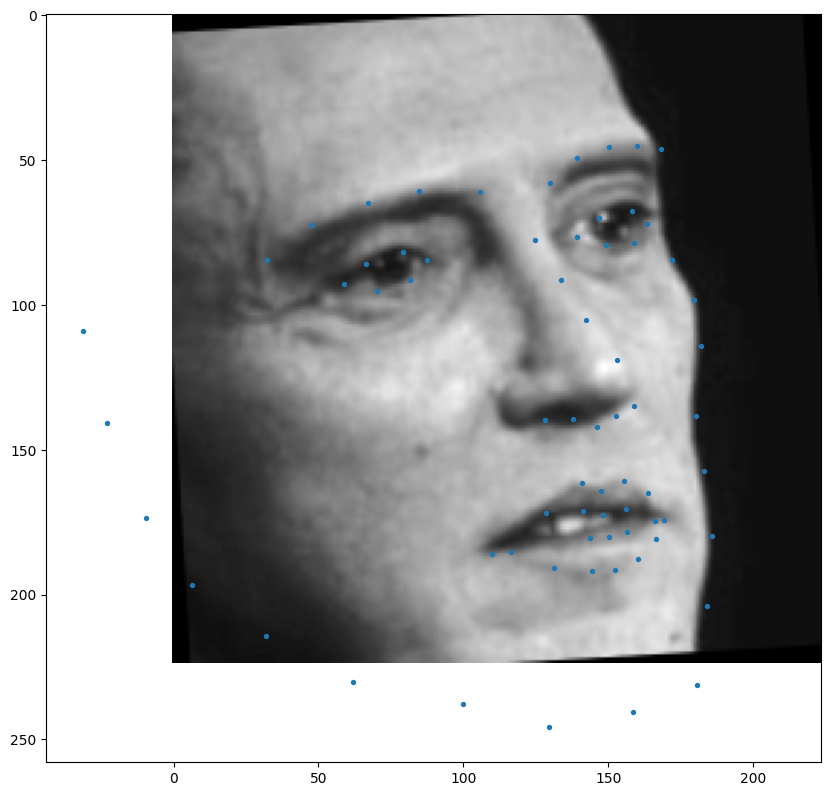

In [ ]:
image, landmarks = dataset[0]
landmarks = (landmarks + 0.5) * 224
plt.figure(figsize=(10, 10))
plt.imshow(image.numpy().squeeze(), cmap='gray');
plt.scatter(landmarks[:,0], landmarks[:,1], s=8);

In [ ]:
# split the dataset into validation and test sets
len_valid_set = int(0.1*len(dataset))
len_train_set = len(dataset) - len_valid_set

print("The length of Train set is {}".format(len_train_set))
print("The length of Valid set is {}".format(len_valid_set))

train_dataset , valid_dataset,  = torch.utils.data.random_split(dataset , [len_train_set, len_valid_set])

# shuffle and batch the datasets
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=4)
valid_loader = torch.utils.data.DataLoader(valid_dataset, batch_size=8, shuffle=True, num_workers=4)

The length of Train set is 6000
The length of Valid set is 666


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
images, landmarks = next(iter(train_loader))

print(images.shape)
print(landmarks.shape)

torch.Size([64, 1, 224, 224])
torch.Size([64, 68, 2])


In [ ]:
class Network(nn.Module):
    def __init__(self,num_classes=136):
        super().__init__()
        self.model_name='resnet18'
        self.model=models.resnet18()
        self.model.conv1=nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.model.fc=nn.Linear(self.model.fc.in_features, num_classes)

    def forward(self, x):
        x=self.model(x)
        return x

In [ ]:
import sys

def print_overwrite(step, total_step, loss, operation):
    sys.stdout.write('\r')
    if operation == 'train':
        sys.stdout.write("Train Steps: %d/%d  Loss: %.4f " % (step, total_step, loss))
    else:
        sys.stdout.write("Valid Steps: %d/%d  Loss: %.4f " % (step, total_step, loss))

    sys.stdout.flush()

In [ ]:
torch.autograd.set_detect_anomaly(True)
network = Network()
network.cuda()

criterion = nn.MSELoss()
optimizer = optim.Adam(network.parameters(), lr=0.0001)

loss_min = np.inf
num_epochs = 10

start_time = time.time()
for epoch in range(1,num_epochs+1):

    loss_train = 0
    loss_valid = 0
    running_loss = 0

    network.train()
    for step in range(1,len(train_loader)+1):

        images, landmarks = next(iter(train_loader))

        images = images.cuda()
        landmarks = landmarks.view(landmarks.size(0),-1).cuda()

        predictions = network(images)

        # clear all the gradients before calculating them
        optimizer.zero_grad()

        # find the loss for the current step
        loss_train_step = criterion(predictions, landmarks)

        # calculate the gradients
        loss_train_step.backward()

        # update the parameters
        optimizer.step()

        loss_train += loss_train_step.item()
        running_loss = loss_train/step

        print_overwrite(step, len(train_loader), running_loss, 'train')

    network.eval()
    with torch.no_grad():

        for step in range(1,len(valid_loader)+1):

            images, landmarks = next(iter(valid_loader))

            images = images.cuda()
            landmarks = landmarks.view(landmarks.size(0),-1).cuda()

            predictions = network(images)

            # find the loss for the current step
            loss_valid_step = criterion(predictions, landmarks)

            loss_valid += loss_valid_step.item()
            running_loss = loss_valid/step

            print_overwrite(step, len(valid_loader), running_loss, 'valid')

    loss_train /= len(train_loader)
    loss_valid /= len(valid_loader)

    print('\n--------------------------------------------------')
    print('Epoch: {}  Train Loss: {:.4f}  Valid Loss: {:.4f}'.format(epoch, loss_train, loss_valid))
    print('--------------------------------------------------')

    if loss_valid < loss_min:
        loss_min = loss_valid
        torch.save(network.state_dict(), '/content/face_landmarks.pth')
        print("\nMinimum Validation Loss of {:.4f} at epoch {}/{}".format(loss_min, epoch, num_epochs))
        print('Model Saved\n')
print('Training Complete')
print("Total Elapsed Time : {} s".format(time.time()-start_time))

Valid Steps: 84/84  Loss: 0.0063 
--------------------------------------------------
Epoch: 1  Train Loss: 0.0218  Valid Loss: 0.0063
--------------------------------------------------

Minimum Validation Loss of 0.0063 at epoch 1/10
Model Saved

Valid Steps: 84/84  Loss: 0.0050 
--------------------------------------------------
Epoch: 2  Train Loss: 0.0056  Valid Loss: 0.0050
--------------------------------------------------

Minimum Validation Loss of 0.0050 at epoch 2/10
Model Saved

Train Steps: 7/94  Loss: 0.0051 

KeyboardInterrupt: ignored

In [ ]:
start_time = time.time()

with torch.no_grad():

    best_network = Network()
    best_network.cuda()
    best_network.load_state_dict(torch.load('/content/face_landmarks.pth'))
    best_network.eval()

    images, landmarks = next(iter(valid_loader))

    images = images.cuda()
    landmarks = (landmarks + 0.5) * 224

    predictions = (best_network(images).cpu() + 0.5) * 224
    predictions = predictions.view(-1,68,2)

    plt.figure(figsize=(10,40))

    for img_num in range(8):
        plt.subplot(8,1,img_num+1)
        plt.imshow(images[img_num].cpu().numpy().transpose(1,2,0).squeeze(), cmap='gray')
        plt.scatter(predictions[img_num,:,0], predictions[img_num,:,1], c = 'r', s = 5)
        plt.scatter(landmarks[img_num,:,0], landmarks[img_num,:,1], c = 'g', s = 5)

print('Total number of test images: {}'.format(len(valid_dataset)))

end_time = time.time()
print("Elapsed Time : {}".format(end_time - start_time))

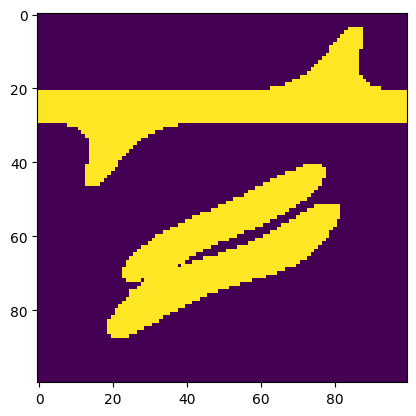

The route found covers 127 grid cells.


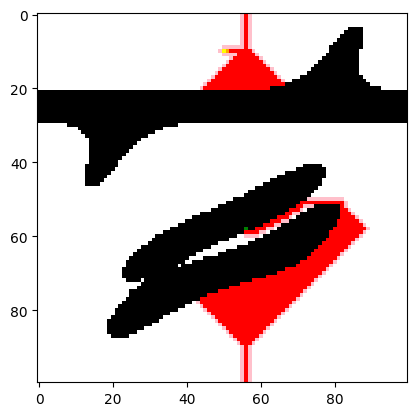

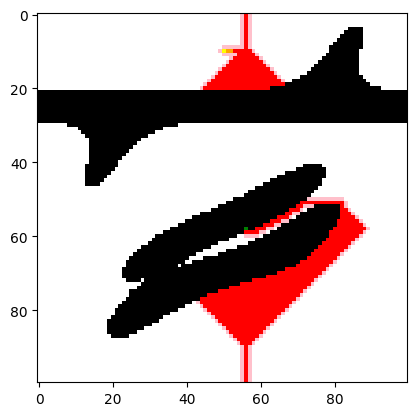

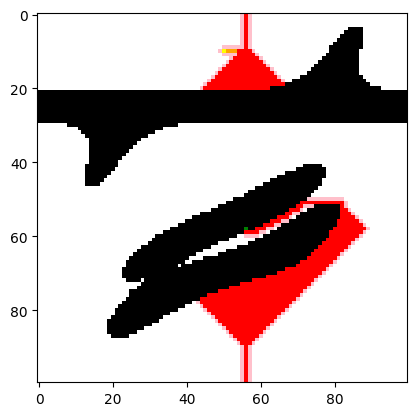

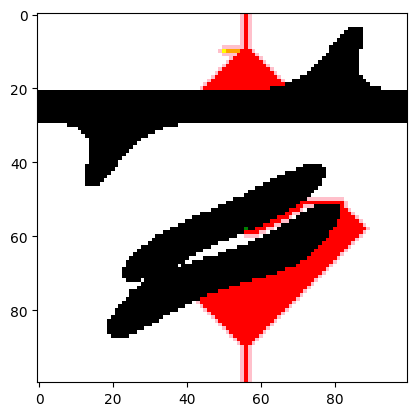

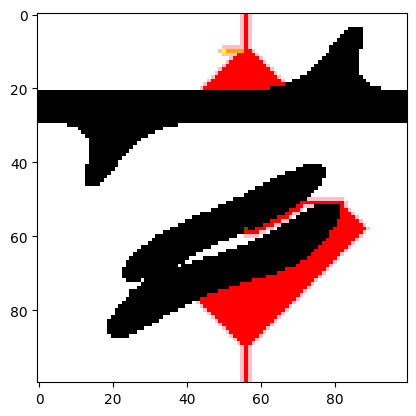

...

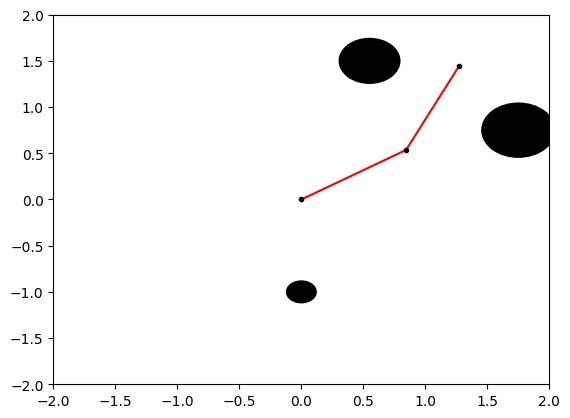

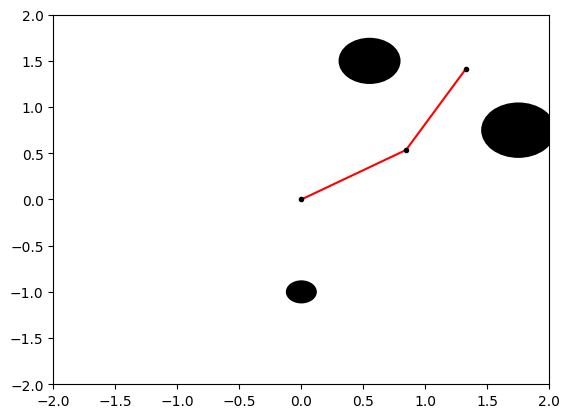

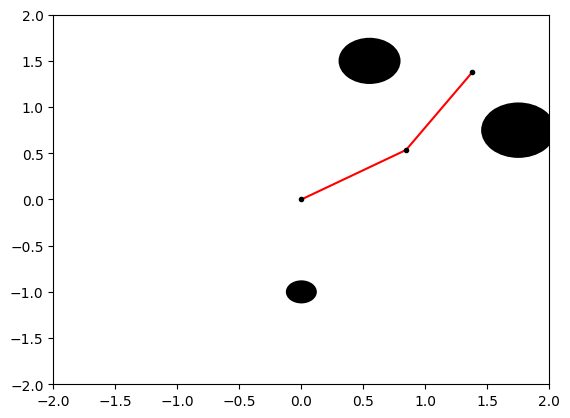

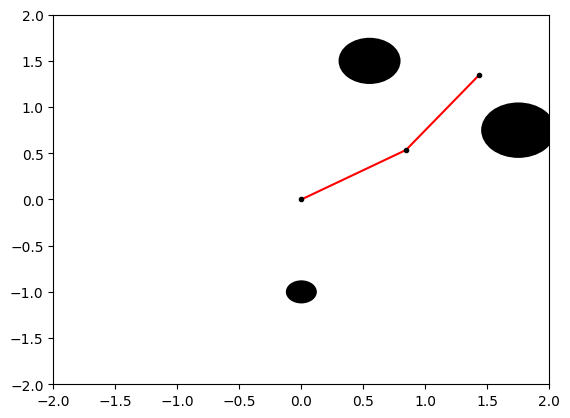

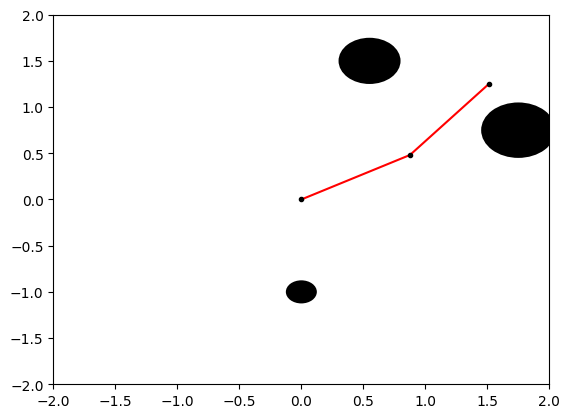

In [ ]:
from math import pi
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import from_levels_and_colors

plt.ion()

# Simulation parameters
M = 100
obstacles = [[1.75, 0.75, 0.6], [0.55, 1.5, 0.5], [0, -1, 0.25]]


def main():
    arm = NLinkArm([1, 1], [0, 0])
    start = (10, 50)
    goal = (58, 56)
    grid = get_occupancy_grid(arm, obstacles)
    plt.imshow(grid)
    plt.show()
    route = astar_torus(grid, start, goal)
    for node in route:
        theta1 = 2 * pi * node[0] / M - pi
        theta2 = 2 * pi * node[1] / M - pi
        arm.update_joints([theta1, theta2])
        arm.plot(obstacles=obstacles)


def detect_collision(line_seg, circle):
    """
    Determines whether a line segment (arm link) is in contact
    with a circle (obstacle).
    Credit to: http://doswa.com/2009/07/13/circle-segment-intersectioncollision.html
    Args:
        line_seg: List of coordinates of line segment endpoints e.g. [[1, 1], [2, 2]]
        circle: List of circle coordinates and radius e.g. [0, 0, 0.5] is a circle centered
                at the origin with radius 0.5

    Returns:
        True if the line segment is in contact with the circle
        False otherwise
    """
    a_vec = np.array([line_seg[0][0], line_seg[0][1]])
    b_vec = np.array([line_seg[1][0], line_seg[1][1]])
    c_vec = np.array([circle[0], circle[1]])
    radius = circle[2]
    line_vec = b_vec - a_vec
    line_mag = np.linalg.norm(line_vec)
    circle_vec = c_vec - a_vec
    proj = circle_vec.dot(line_vec / line_mag)
    if proj <= 0:
        closest_point = a_vec
    elif proj >= line_mag:
        closest_point = b_vec
    else:
        closest_point = a_vec + line_vec * proj / line_mag
    if np.linalg.norm(closest_point - c_vec) > radius:
        return False

    return True


def get_occupancy_grid(arm, obstacles):
    """
    Discretizes joint space into M values from -pi to +pi
    and determines whether a given coordinate in joint space
    would result in a collision between a robot arm and obstacles
    in its environment.

    Args:
        arm: An instance of NLinkArm
        obstacles: A list of obstacles, with each obstacle defined as a list
                   of xy coordinates and a radius.

    Returns:
        Occupancy grid in joint space
    """
    grid = [[0 for _ in range(M)] for _ in range(M)]
    theta_list = [2 * i * pi / M for i in range(-M // 2, M // 2 + 1)]
    for i in range(M):
        for j in range(M):
            arm.update_joints([theta_list[i], theta_list[j]])
            points = arm.points
            collision_detected = False
            for k in range(len(points) - 1):
                for obstacle in obstacles:
                    line_seg = [points[k], points[k + 1]]
                    collision_detected = detect_collision(line_seg, obstacle)
                    if collision_detected:
                        break
                if collision_detected:
                    break
            grid[i][j] = int(collision_detected)
    return np.array(grid)


def astar_torus(grid, start_node, goal_node):
    """
    Finds a path between an initial and goal joint configuration using
    the A* Algorithm on a tororiadal grid.

    Args:
        grid: An occupancy grid (ndarray)
        start_node: Initial joint configuration (tuple)
        goal_node: Goal joint configuration (tuple)

    Returns:
        Obstacle-free route in joint space from start_node to goal_node
    """
    colors = ['white', 'black', 'red', 'pink', 'yellow', 'green', 'orange']
    levels = [0, 1, 2, 3, 4, 5, 6, 7]
    cmap, norm = from_levels_and_colors(levels, colors)

    grid[start_node] = 4
    grid[goal_node] = 5

    parent_map = [[() for _ in range(M)] for _ in range(M)]

    heuristic_map = calc_heuristic_map(M, goal_node)

    explored_heuristic_map = np.full((M, M), np.inf)
    distance_map = np.full((M, M), np.inf)
    explored_heuristic_map[start_node] = heuristic_map[start_node]
    distance_map[start_node] = 0
    while True:
        grid[start_node] = 4
        grid[goal_node] = 5

        current_node = np.unravel_index(
            np.argmin(explored_heuristic_map, axis=None), explored_heuristic_map.shape)
        min_distance = np.min(explored_heuristic_map)
        if (current_node == goal_node) or np.isinf(min_distance):
            break

        grid[current_node] = 2
        explored_heuristic_map[current_node] = np.inf

        i, j = current_node[0], current_node[1]

        neighbors = find_neighbors(i, j)

        for neighbor in neighbors:
            if grid[neighbor] == 0 or grid[neighbor] == 5:
                distance_map[neighbor] = distance_map[current_node] + 1
                explored_heuristic_map[neighbor] = heuristic_map[neighbor]
                parent_map[neighbor[0]][neighbor[1]] = current_node
                grid[neighbor] = 3

    if np.isinf(explored_heuristic_map[goal_node]):
        route = []
        print("No route found.")
    else:
        route = [goal_node]
        while parent_map[route[0][0]][route[0][1]] != ():
            route.insert(0, parent_map[route[0][0]][route[0][1]])

        print("The route found covers %d grid cells." % len(route))
        for i in range(1, len(route)):
            grid[route[i]] = 6
            plt.cla()
            # for stopping simulation with the esc key.
            plt.gcf().canvas.mpl_connect('key_release_event',
                    lambda event: [exit(0) if event.key == 'escape' else None])
            plt.imshow(grid, cmap=cmap, norm=norm, interpolation=None)
            plt.show()
            plt.pause(1e-2)

    return route


def find_neighbors(i, j):
    neighbors = []
    if i - 1 >= 0:
        neighbors.append((i - 1, j))
    else:
        neighbors.append((M - 1, j))

    if i + 1 < M:
        neighbors.append((i + 1, j))
    else:
        neighbors.append((0, j))

    if j - 1 >= 0:
        neighbors.append((i, j - 1))
    else:
        neighbors.append((i, M - 1))

    if j + 1 < M:
        neighbors.append((i, j + 1))
    else:
        neighbors.append((i, 0))

    return neighbors


def calc_heuristic_map(M, goal_node):
    X, Y = np.meshgrid([i for i in range(M)], [i for i in range(M)])
    heuristic_map = np.abs(X - goal_node[1]) + np.abs(Y - goal_node[0])
    for i in range(heuristic_map.shape[0]):
        for j in range(heuristic_map.shape[1]):
            heuristic_map[i, j] = min(heuristic_map[i, j],
                                      i + 1 + heuristic_map[M - 1, j],
                                      M - i + heuristic_map[0, j],
                                      j + 1 + heuristic_map[i, M - 1],
                                      M - j + heuristic_map[i, 0]
                                      )

    return heuristic_map


class NLinkArm(object):
    """
    Class for controlling and plotting a planar arm with an arbitrary number of links.
    """

    def __init__(self, link_lengths, joint_angles):
        self.n_links = len(link_lengths)
        if self.n_links != len(joint_angles):
            raise ValueError()

        self.link_lengths = np.array(link_lengths)
        self.joint_angles = np.array(joint_angles)
        self.points = [[0, 0] for _ in range(self.n_links + 1)]

        self.lim = sum(link_lengths)
        self.update_points()

    def update_joints(self, joint_angles):
        self.joint_angles = joint_angles
        self.update_points()

    def update_points(self):
        for i in range(1, self.n_links + 1):
            self.points[i][0] = self.points[i - 1][0] + \
                self.link_lengths[i - 1] * \
                np.cos(np.sum(self.joint_angles[:i]))
            self.points[i][1] = self.points[i - 1][1] + \
                self.link_lengths[i - 1] * \
                np.sin(np.sum(self.joint_angles[:i]))

        self.end_effector = np.array(self.points[self.n_links]).T

    def plot(self, obstacles=[]):  # pragma: no cover
        plt.cla()

        for obstacle in obstacles:
            circle = plt.Circle(
                (obstacle[0], obstacle[1]), radius=0.5 * obstacle[2], fc='k')
            plt.gca().add_patch(circle)

        for i in range(self.n_links + 1):
            if i is not self.n_links:
                plt.plot([self.points[i][0], self.points[i + 1][0]],
                         [self.points[i][1], self.points[i + 1][1]], 'r-')
            plt.plot(self.points[i][0], self.points[i][1], 'k.')

        plt.xlim([-self.lim, self.lim])
        plt.ylim([-self.lim, self.lim])
        plt.draw()
        plt.pause(1e-5)


if __name__ == '__main__':
    main()

The route found covers 227 grid cells.


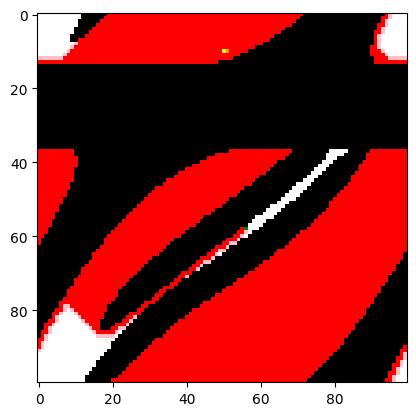

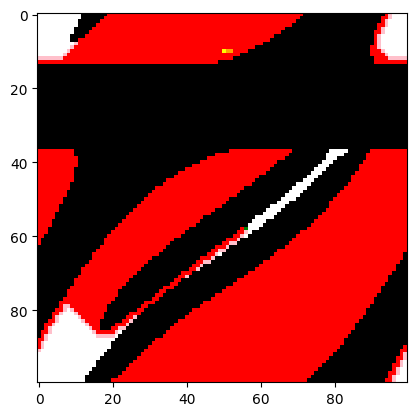

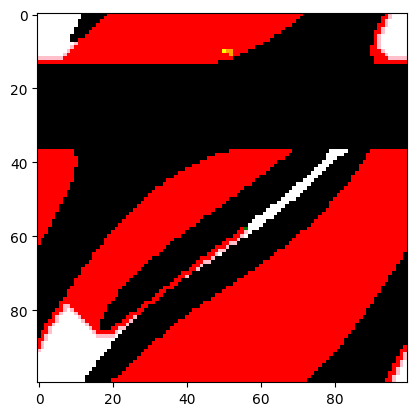

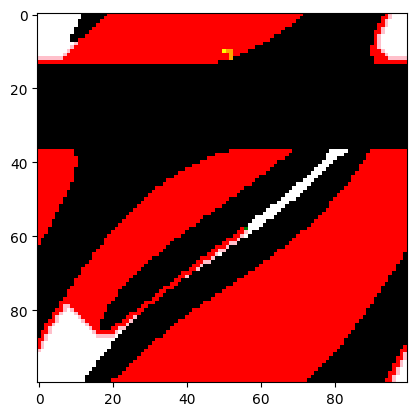

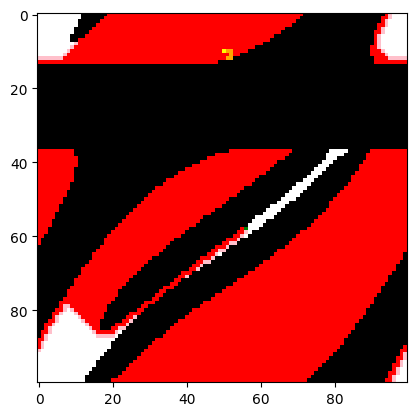

...

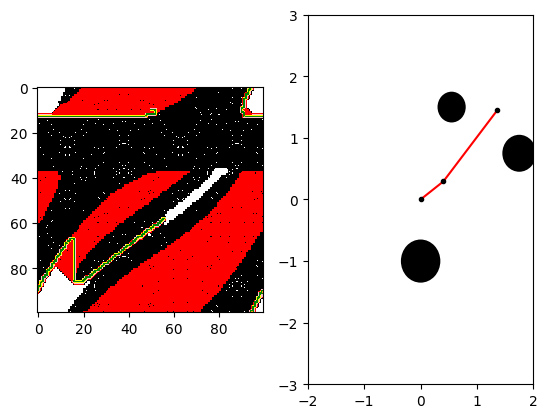

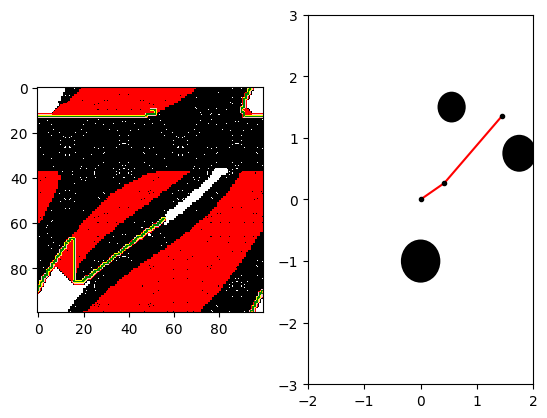

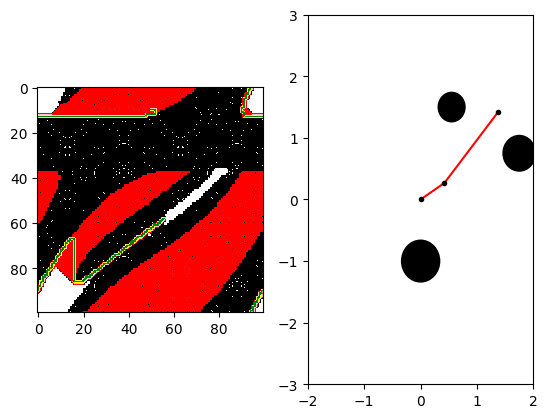

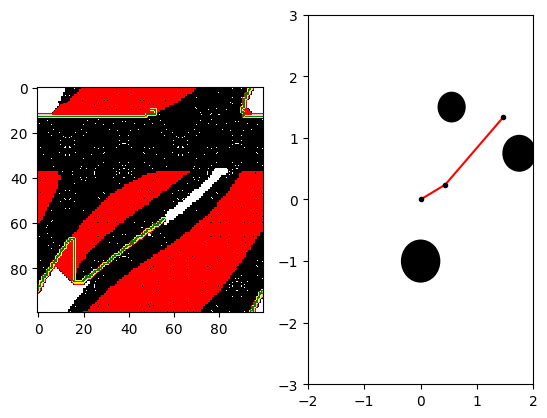

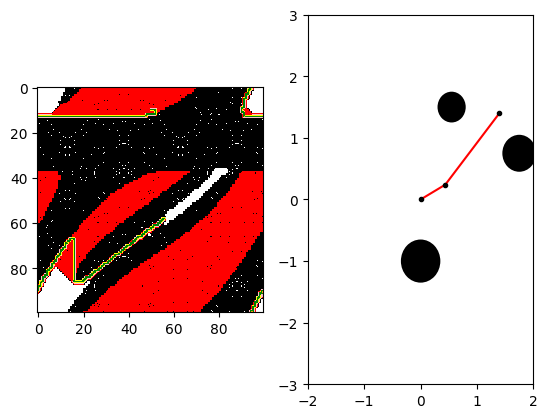

In [ ]:
from math import pi
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import from_levels_and_colors
import sys

plt.ion()

# Simulation parameters
M = 100
obstacles = [[1.75, 0.75, 0.6], [0.55, 1.5, 0.5], [0, -1, 0.7]]


def press(event):
    """Exit from the simulation."""
    if event.key == 'q' or event.key == 'Q':
        print('Quitting upon request.')
        sys.exit(0)


def main():
    # Arm geometry in the working space
    link_length = [0.5, 1.5]
    initial_link_angle = [0, 0]
    arm = NLinkArm(link_length, initial_link_angle)
    # (x, y) co-ordinates in the joint space [cell]
    start = (10, 50)
    goal = (58, 56)
    grid = get_occupancy_grid(arm, obstacles)
    route = astar_torus(grid, start, goal)
    if route:
        animate(grid, arm, route)


def animate(grid, arm, route):
    fig, axs = plt.subplots(1, 2)
    fig.canvas.mpl_connect('key_press_event', press)
    colors = ['white', 'black', 'red', 'pink', 'yellow', 'green', 'orange']
    levels = [0, 1, 2, 3, 4, 5, 6, 7]
    cmap, norm = from_levels_and_colors(levels, colors)
    for i, node in enumerate(route):
        plt.subplot(1, 2, 1)
        grid[node] = 6
        plt.cla()
        plt.imshow(grid, cmap=cmap, norm=norm, interpolation=None)
        theta1 = 2 * pi * node[0] / M - pi
        theta2 = 2 * pi * node[1] / M - pi
        arm.update_joints([theta1, theta2])
        plt.subplot(1, 2, 2)
        arm.plot_arm(plt, obstacles=obstacles)
        plt.xlim(-2.0, 2.0)
        plt.ylim(-3.0, 3.0)
        plt.show()
        # Uncomment here to save the sequence of frames
        # plt.savefig('frame{:04d}.png'.format(i))
        plt.pause(0.1)


def detect_collision(line_seg, circle):
    """
    Determines whether a line segment (arm link) is in contact
    with a circle (obstacle).
    Credit to: http://doswa.com/2009/07/13/circle-segment-intersectioncollision.html
    Args:
        line_seg: List of coordinates of line segment endpoints e.g. [[1, 1], [2, 2]]
        circle: List of circle coordinates and radius e.g. [0, 0, 0.5] is a circle centered
                at the origin with radius 0.5

    Returns:
        True if the line segment is in contact with the circle
        False otherwise
    """
    a_vec = np.array([line_seg[0][0], line_seg[0][1]])
    b_vec = np.array([line_seg[1][0], line_seg[1][1]])
    c_vec = np.array([circle[0], circle[1]])
    radius = circle[2]
    line_vec = b_vec - a_vec
    line_mag = np.linalg.norm(line_vec)
    circle_vec = c_vec - a_vec
    proj = circle_vec.dot(line_vec / line_mag)
    if proj <= 0:
        closest_point = a_vec
    elif proj >= line_mag:
        closest_point = b_vec
    else:
        closest_point = a_vec + line_vec * proj / line_mag
    if np.linalg.norm(closest_point - c_vec) > radius:
        return False
    return True


def get_occupancy_grid(arm, obstacles):
    """
    Discretizes joint space into M values from -pi to +pi
    and determines whether a given coordinate in joint space
    would result in a collision between a robot arm and obstacles
    in its environment.

    Args:
        arm: An instance of NLinkArm
        obstacles: A list of obstacles, with each obstacle defined as a list
                   of xy coordinates and a radius.

    Returns:
        Occupancy grid in joint space
    """
    grid = [[0 for _ in range(M)] for _ in range(M)]
    theta_list = [2 * i * pi / M for i in range(-M // 2, M // 2 + 1)]
    for i in range(M):
        for j in range(M):
            arm.update_joints([theta_list[i], theta_list[j]])
            points = arm.points
            collision_detected = False
            for k in range(len(points) - 1):
                for obstacle in obstacles:
                    line_seg = [points[k], points[k + 1]]
                    collision_detected = detect_collision(line_seg, obstacle)
                    if collision_detected:
                        break
                if collision_detected:
                    break
            grid[i][j] = int(collision_detected)
    return np.array(grid)


def astar_torus(grid, start_node, goal_node):
    """
    Finds a path between an initial and goal joint configuration using
    the A* Algorithm on a tororiadal grid.

    Args:
        grid: An occupancy grid (ndarray)
        start_node: Initial joint configuration (tuple)
        goal_node: Goal joint configuration (tuple)

    Returns:
        Obstacle-free route in joint space from start_node to goal_node
    """
    colors = ['white', 'black', 'red', 'pink', 'yellow', 'green', 'orange']
    levels = [0, 1, 2, 3, 4, 5, 6, 7]
    cmap, norm = from_levels_and_colors(levels, colors)

    grid[start_node] = 4
    grid[goal_node] = 5

    parent_map = [[() for _ in range(M)] for _ in range(M)]

    heuristic_map = calc_heuristic_map(M, goal_node)

    explored_heuristic_map = np.full((M, M), np.inf)
    distance_map = np.full((M, M), np.inf)
    explored_heuristic_map[start_node] = heuristic_map[start_node]
    distance_map[start_node] = 0
    while True:
        grid[start_node] = 4
        grid[goal_node] = 5

        current_node = np.unravel_index(
            np.argmin(explored_heuristic_map, axis=None), explored_heuristic_map.shape)
        min_distance = np.min(explored_heuristic_map)
        if (current_node == goal_node) or np.isinf(min_distance):
            break

        grid[current_node] = 2
        explored_heuristic_map[current_node] = np.inf

        i, j = current_node[0], current_node[1]

        neighbors = find_neighbors(i, j)

        for neighbor in neighbors:
            if grid[neighbor] == 0 or grid[neighbor] == 5:
                distance_map[neighbor] = distance_map[current_node] + 1
                explored_heuristic_map[neighbor] = heuristic_map[neighbor]
                parent_map[neighbor[0]][neighbor[1]] = current_node
                grid[neighbor] = 3

    if np.isinf(explored_heuristic_map[goal_node]):
        route = []
        print("No route found.")
    else:
        route = [goal_node]
        while parent_map[route[0][0]][route[0][1]] != ():
            route.insert(0, parent_map[route[0][0]][route[0][1]])

        print("The route found covers %d grid cells." % len(route))
        for i in range(1, len(route)):
            grid[route[i]] = 6
            plt.cla()
            # for stopping simulation with the esc key.
            plt.gcf().canvas.mpl_connect('key_release_event',
                    lambda event: [exit(0) if event.key == 'escape' else None])
            plt.imshow(grid, cmap=cmap, norm=norm, interpolation=None)
            plt.show()
            plt.pause(1e-2)

    return route


def find_neighbors(i, j):
    neighbors = []
    if i - 1 >= 0:
        neighbors.append((i - 1, j))
    else:
        neighbors.append((M - 1, j))

    if i + 1 < M:
        neighbors.append((i + 1, j))
    else:
        neighbors.append((0, j))

    if j - 1 >= 0:
        neighbors.append((i, j - 1))
    else:
        neighbors.append((i, M - 1))

    if j + 1 < M:
        neighbors.append((i, j + 1))
    else:
        neighbors.append((i, 0))

    return neighbors


def calc_heuristic_map(M, goal_node):
    X, Y = np.meshgrid([i for i in range(M)], [i for i in range(M)])
    heuristic_map = np.abs(X - goal_node[1]) + np.abs(Y - goal_node[0])
    for i in range(heuristic_map.shape[0]):
        for j in range(heuristic_map.shape[1]):
            heuristic_map[i, j] = min(heuristic_map[i, j],
                                      i + 1 + heuristic_map[M - 1, j],
                                      M - i + heuristic_map[0, j],
                                      j + 1 + heuristic_map[i, M - 1],
                                      M - j + heuristic_map[i, 0]
                                      )

    return heuristic_map


class NLinkArm(object):
    """
    Class for controlling and plotting a planar arm with an arbitrary number of links.
    """

    def __init__(self, link_lengths, joint_angles):
        self.n_links = len(link_lengths)
        if self.n_links != len(joint_angles):
            raise ValueError()

        self.link_lengths = np.array(link_lengths)
        self.joint_angles = np.array(joint_angles)
        self.points = [[0, 0] for _ in range(self.n_links + 1)]

        self.lim = sum(link_lengths)
        self.update_points()

    def update_joints(self, joint_angles):
        self.joint_angles = joint_angles
        self.update_points()

    def update_points(self):
        for i in range(1, self.n_links + 1):
            self.points[i][0] = self.points[i - 1][0] + \
                self.link_lengths[i - 1] * \
                np.cos(np.sum(self.joint_angles[:i]))
            self.points[i][1] = self.points[i - 1][1] + \
                self.link_lengths[i - 1] * \
                np.sin(np.sum(self.joint_angles[:i]))

        self.end_effector = np.array(self.points[self.n_links]).T

    def plot_arm(self, myplt, obstacles=[]):  # pragma: no cover
        myplt.cla()

        for obstacle in obstacles:
            circle = myplt.Circle(
                (obstacle[0], obstacle[1]), radius=0.5 * obstacle[2], fc='k')
            myplt.gca().add_patch(circle)

        for i in range(self.n_links + 1):
            if i is not self.n_links:
                myplt.plot([self.points[i][0], self.points[i + 1][0]],
                           [self.points[i][1], self.points[i + 1][1]], 'r-')
            myplt.plot(self.points[i][0], self.points[i][1], 'k.')

        myplt.xlim([-self.lim, self.lim])
        myplt.ylim([-self.lim, self.lim])
        myplt.draw()
        # myplt.pause(1e-5)


if __name__ == '__main__':
    main()